In this notebook, we will demonstrate the capabilities of our model. We will show how to train the model for a specific image and also show the process of multiple runs and subsequent averaging of prediction results for greater stability and improved prediction quality.

Required imports and choosing the device to run the model on:

In [1]:
import torch
import os

from scripts.imagedata import ImageData
from scripts.neutralliner import NeutralLiner
from scripts.config import PATH_TO_MCINTOSH

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
torch.cuda.set_device(device)

c:\jupyter_workspace\PIL\.venv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Single run of the model

Here we will try to reconstruct the polarity map corresponding to Carrington rotation 1355 based on data about filaments. We will use grid-based reference points with a step size of 32. Additionally, it is worth noting that the model's functionality allows training not only on FITS files but also on any single-channel images that can be interpreted as a map with filaments.

In [2]:
mapname = os.listdir(PATH_TO_MCINTOSH)[0]
num_epochs = 10000
arch = [3, 6, 12, 24, 12, 6, 3, 1]
lr = 5e-3
weight_decay = 1e-4
help_step_size = 32

Using the **ImageData** class, we extract the data of interest about filaments (input) and the polarity map (target). Additionally, we print the information about the extracted input data and plot the input and target data.

width: 256
height: 512
total_pixel: 131072
bound length: 2193
percent of bound pixels: 1.7%


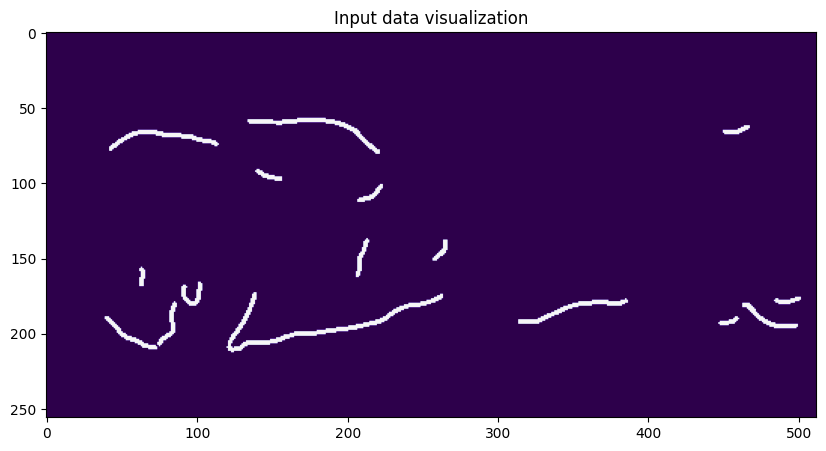

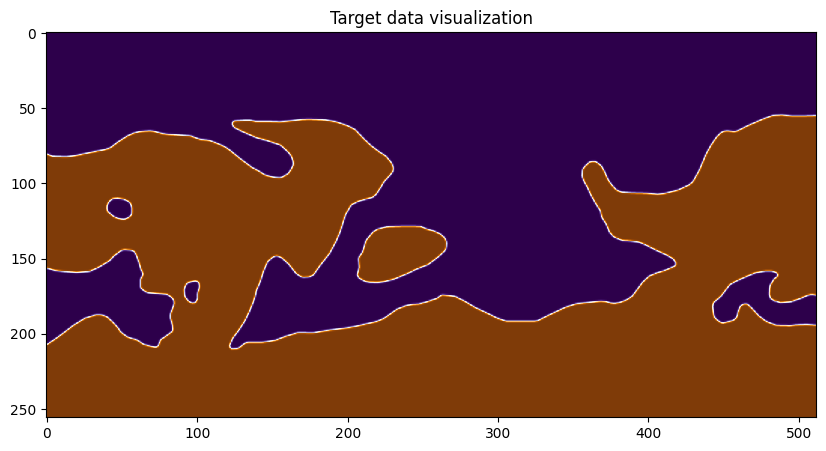

In [3]:
imgdata = ImageData(path_or_img=os.path.join(PATH_TO_MCINTOSH, mapname), data_mode='fits')
imgdata.get_info()
imgdata.show_input_img()
imgdata.show_target_img()

We will initialize our model and start the training. In the output window, one can observe the loss graph and its components separately.

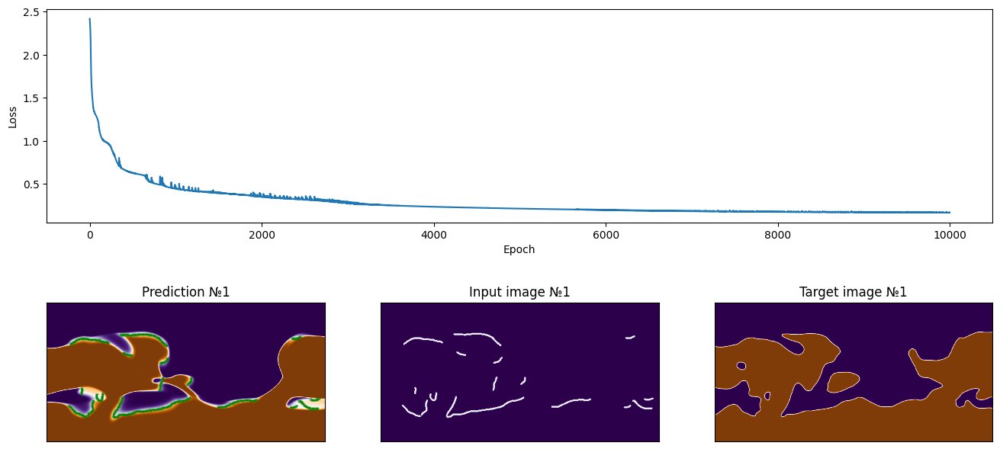

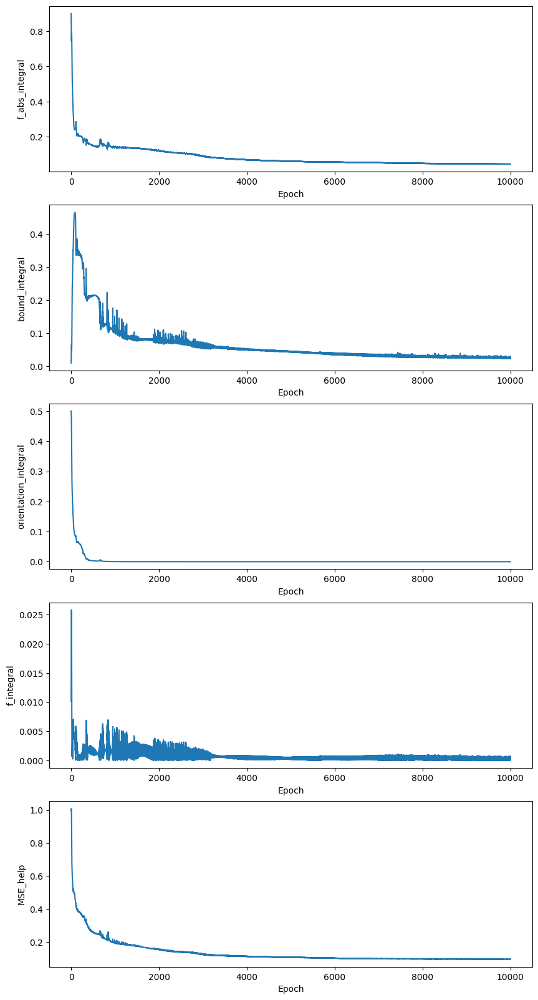

In [4]:
model = NeutralLiner(image_list=[imgdata],
                    lr=lr,
                    arch=arch,
                    mode='3d',
                    help_step_size=help_step_size,
                    weight_decay=weight_decay,
                    device=device)
model.to(device)
model.start_training(num_epochs=num_epochs, need_plot=True)

The functionality of the model allows depicting the map of the $L_2$ norm of the gradient of the constructed function $f(x, y, z)$.

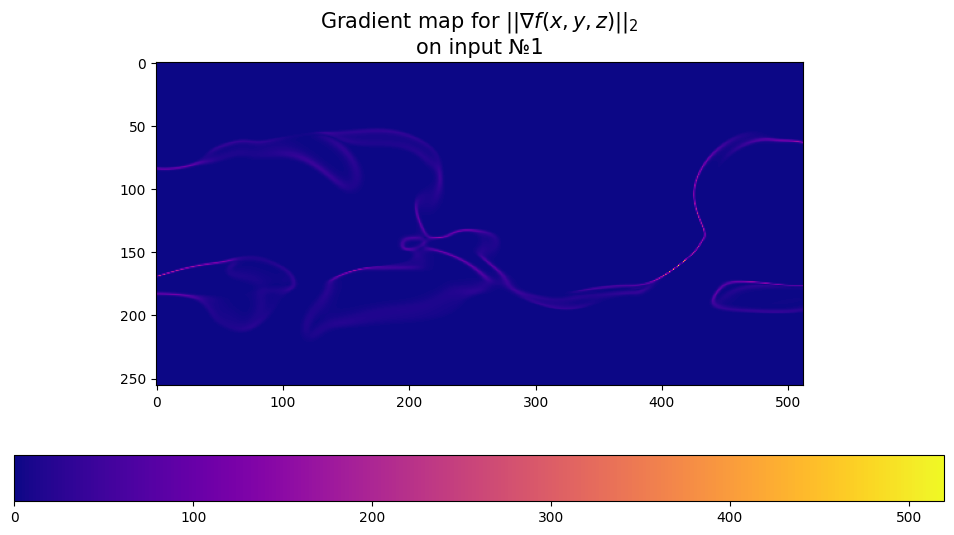

In [5]:
_ = model.compute_and_plot_gradient()

Here you can see the visualization of the function $f$ on the surface of the cylinder $\mathcal{C} \subset \mathbb{R}^3$.

In [6]:
prediction = model.test_model(need_plot=False)
model.show_3d(prediction)

# Averaging over multiple runs

As can be seen, the prediction obtained in the previous section is far from the target. Therefore, we address this problem as follows: here we will train 100 independent models for the same map and average all predictions.

In [ ]:
n_runs = 100
mapname = os.listdir(PATH_TO_MCINTOSH)[0]
num_epochs = 30000
arch = [3, 6, 12, 24, 12, 6, 3, 1]
lr = 5e-3
weight_decay = 1e-4
help_step_size = 32

Text(0.5, 1.0, 'Binarized prediction')

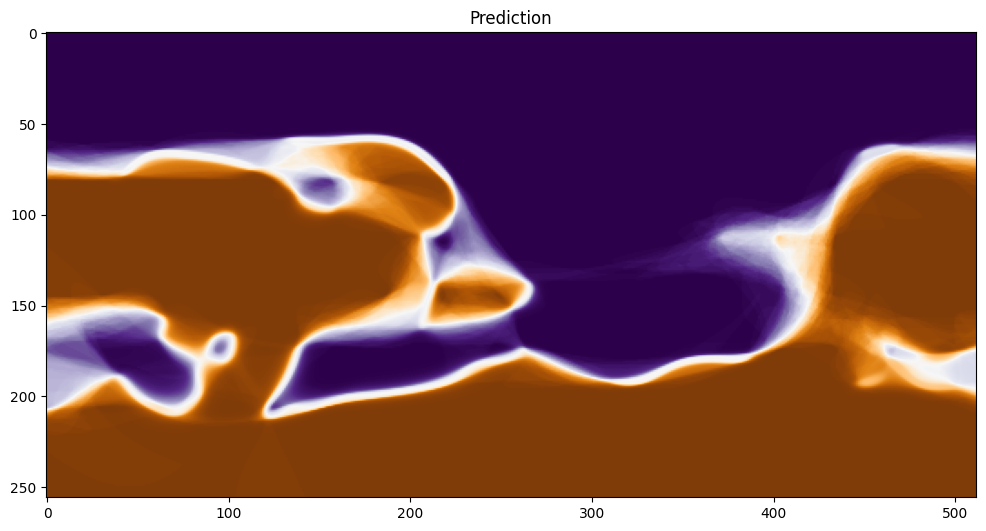

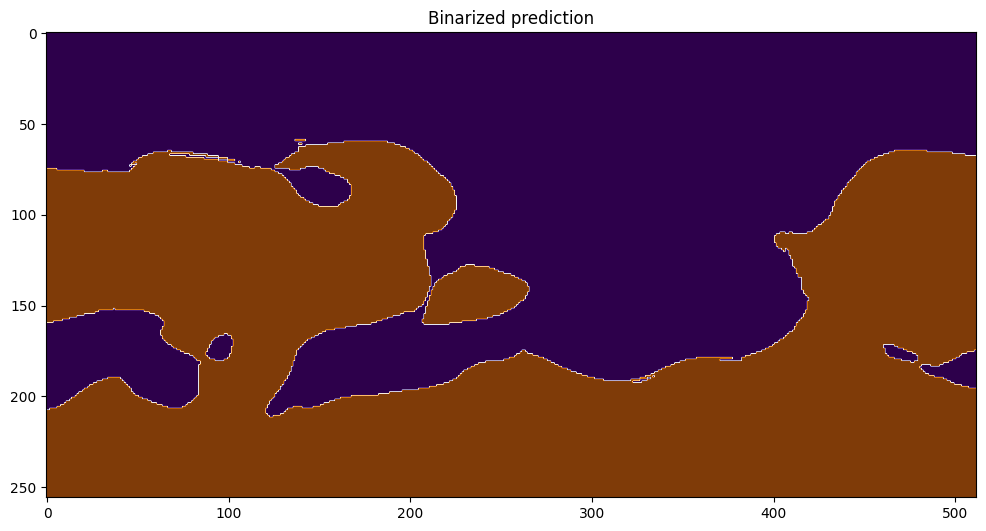

In [3]:
predictions = []

for n in range(n_runs):
    model = NeutralLiner(image_list=[imgdata],
                    lr=lr,
                    arch=arch,
                    mode='3d',
                    help_step_size=help_step_size,
                    weight_decay=weight_decay,
                    device=device)
    model.to(device)
    model.start_training(num_epochs=num_epochs, need_plot=False)
    prediction = model.test_model(need_plot=False)[0].view(model.image_list[0].img_array.shape).cpu().detach()
    predictions.append(prediction)
predictions = torch.stack(predictions)
prediction = torch.mean(predictions, dim=0)

plt.figure(figsize=(12, 10))
plt.imshow(prediction, cmap='PuOr', vmin=-1, vmax=1)
plt.title('Prediction')

plt.figure(figsize=(12, 10))
plt.imshow(prediction > 0, cmap='PuOr', vmin=0, vmax=1)
plt.title('Binarized prediction')